# 1. Motivation

* What is your dataset?
    * My dataset is a drawn out dataset from the Forum Reddit. It is all the comments from each post that was featured on hot in in each of the subreddits listed in https://www.reddit.com/r/TheoryOfReddit/comments/1f7hqc/the_200_most_active_subreddits_categorized_by/ . The data was gathered at the start of November 2018. 
    * Also user data has been drawn out, so not only the contents of the comments, but also all unique users that has commented, and which subreddit they have commented on. And by unique users i mean i dont count a user twice if he/she has commented twice on the same post. 
* Why did you choose this/these particular dataset(s)?
    * I thought that it would be interesting to look on some user data and commenter data on some of the most popular subreddits. Especially the data that shows which subreddits each user are using. For example what is the likelihood that if i use subreddit X, will i then use subreddit Y?
* What was your goal for the end user's experience?
    * I was hoping that the end user's gain some interesting information of Reddit. And especially if people as a user of Reddit can find some interesting statistics of peoples behavior. 

# 2. Basic stats. Let's understand the dataset better
* Write about your choices in data cleaning and preprocessing
    * The preprocessing for the data was quite simple, since it was just drawing out all of the comments and then only taking the value of the actual comment, the user and which subreddit the post originated from. Rather than upvotes, downvotes and many other options. However afterwards the data had to be cleaned, because of many links, especially links to other subreddits, or other posts. These have i tried to cut out. But the most important choice was for the users to be unique from each subreddit, so that i am ensuring that i dont gain extra values from redditors that comment many times in many different posts on each subreddit. 


# 3. Tools, theory and analysis

In [1]:
import praw
import psraw
import codecs
import matplotlib.pyplot as plt
import numpy as np
from wordcloud import WordCloud
from __future__ import division
import networkx as nx
import json
import matplotlib.pyplot as plt
import nltk
import os
from community import community_louvain
from fa2 import ForceAtlas2
import seaborn as sn
import pandas as pd
import operator

All users are a dict sorted by subreddit name

In [2]:
f = codecs.open('finalDict2', 'r', encoding='utf-8')
a = f.readline()
all_users = json.loads(a)

# The comments
In this section I will investigate the comments of the subreddits by looking at WordClouds, sentiment and lexical dispersion.

Let's start by looking at wordclouds for the different categories.

In [3]:
all_categories = os.listdir('Data/')

In [4]:
subreddits_category = {} # Key are subreddits, vals are categories
categories_subreddits = {} # Key are categories, vals are subreddits

for category in all_categories:
    subreddits = os.listdir('Data/' + category)
    categories_subreddits[category] = subreddits
    
    for subreddit in subreddits:
        sub_name = subreddit[:-4]
        subreddits_category[sub_name] = category

In [6]:
clouds = {}
category_texts = {} # Key are category name, vals are tokenized arrays of all comments in that category

stop_words = nltk.corpus.stopwords.words('english')
extra_stop_words = [u'one', u'think', u'', u"n't", u'ca', u'look', u'people', u'even', u'know', u'thing']
[stop_words.append(x) for x in extra_stop_words]

ind = 1
subs = 1
for category in all_categories:
    subreddits = os.listdir('Data/' + category)
    
    texts = []
    subs = 1
    for subreddit in subreddits:
        print('Doing category ' + str(ind) + ' of ' + str(len(all_categories)) + '; Doing subreddit ' + str(subs) + ' of ' + str(len(subreddits)))
        text = codecs.open('Data/' + category + '/' + subreddit, mode='r', encoding='utf-8')
        
        actual_text = text.readlines()
        text.close()
        
        actual_text = ' '.join(actual_text)
        actual_text = nltk.word_tokenize(actual_text)
        
        for w in actual_text:
            if w not in stop_words and w.isalpha():
                texts.append(w)
                
        subs += 1
    
    ind += 1
    category_texts[category] = texts
    
    all_text = " ".join(texts)
    wordcloud = WordCloud(background_color="white", width=2400, height=1200).generate(all_text)
    clouds[category] = wordcloud
        

Doing category 1 of 14; Doing subreddit 1 of 12
Doing category 1 of 14; Doing subreddit 2 of 12
Doing category 1 of 14; Doing subreddit 3 of 12
Doing category 1 of 14; Doing subreddit 4 of 12
Doing category 1 of 14; Doing subreddit 5 of 12
Doing category 1 of 14; Doing subreddit 6 of 12
Doing category 1 of 14; Doing subreddit 7 of 12
Doing category 1 of 14; Doing subreddit 8 of 12
Doing category 1 of 14; Doing subreddit 9 of 12
Doing category 1 of 14; Doing subreddit 10 of 12
Doing category 1 of 14; Doing subreddit 11 of 12
Doing category 1 of 14; Doing subreddit 12 of 12
Doing category 2 of 14; Doing subreddit 1 of 21
Doing category 2 of 14; Doing subreddit 2 of 21
Doing category 2 of 14; Doing subreddit 3 of 21
Doing category 2 of 14; Doing subreddit 4 of 21
Doing category 2 of 14; Doing subreddit 5 of 21
Doing category 2 of 14; Doing subreddit 6 of 21
Doing category 2 of 14; Doing subreddit 7 of 21
Doing category 2 of 14; Doing subreddit 8 of 21
Doing category 2 of 14; Doing subredd

Doing category 14 of 14; Doing subreddit 7 of 13
Doing category 14 of 14; Doing subreddit 8 of 13
Doing category 14 of 14; Doing subreddit 9 of 13
Doing category 14 of 14; Doing subreddit 10 of 13
Doing category 14 of 14; Doing subreddit 11 of 13
Doing category 14 of 14; Doing subreddit 12 of 13
Doing category 14 of 14; Doing subreddit 13 of 13


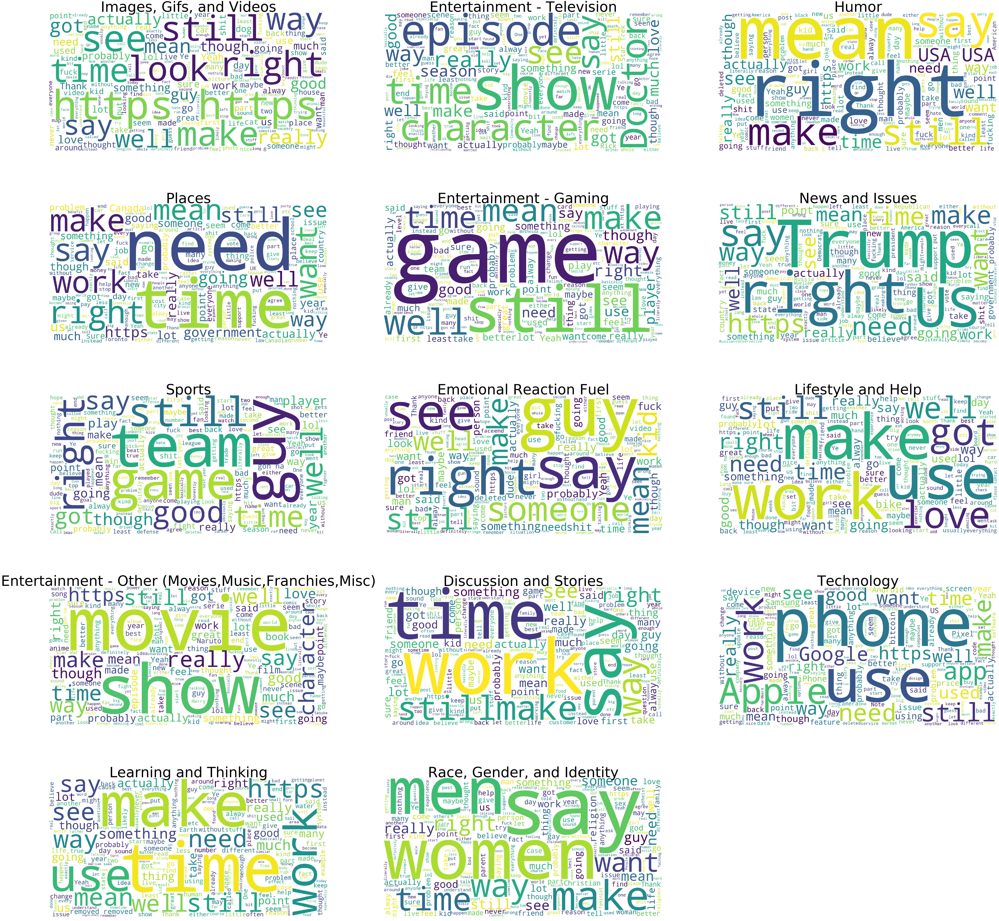

In [7]:
fig, ax = plt.subplots(nrows=5, ncols=3, figsize=(120,120))

all_clouds = clouds.items()
ind = 0
for row in ax:
    for col in row:
        try:
            category, cloud = all_clouds[ind]
            col.imshow(cloud)
            col.axis("off")
            col.title.set_text(category)
            col.title.set_fontsize(100)
            ind += 1
        except:
            ind += 1
            continue

fig.delaxes(ax[4,2])
plt.show()

### Sentiment
Let's now look at sentiment.

As not all words in the english language is a part of the LabMT sentiment list, I have decided to calculate the sentiment as the average of the words that do occur in the LabMT list. This means that all other words will have no effect on the sentiment score.

In [8]:
df = pd.read_csv('labmt.txt',sep='\t',header=(0))

word_havgs = {}

# Sort all words and averages into a dict for faster look-up.
for uid, row in df.iterrows():
    word = row[0]
    h_avg = row[2]
    word_havgs[word] = h_avg

# Input: word
# Output: happiness_average if word exists, else None 
def get_happy_avg(word):
    try:
        return word_havgs[word]
    except:
        return None

In [9]:
labels = []
vals = []

for category, text in category_texts.items():
    print('Doing category: ' + category)
    s = 0
    count = 0
    ind = 0
    for word in text:
        if ind % 100000 == 0:
            print(str(ind) + ' of ' + str(len(text)))
            
        avg = get_happy_avg(word)
        if avg != None:
            s += avg
            count += 1
        ind += 1

    sentiment = s/count
    vals.append(sentiment)
    labels.append(category)

Doing category: Images, Gifs, and Videos
0 of 4210614
100000 of 4210614
200000 of 4210614
300000 of 4210614
400000 of 4210614
500000 of 4210614
600000 of 4210614
700000 of 4210614
800000 of 4210614
900000 of 4210614
1000000 of 4210614
1100000 of 4210614
1200000 of 4210614
1300000 of 4210614
1400000 of 4210614
1500000 of 4210614
1600000 of 4210614
1700000 of 4210614
1800000 of 4210614
1900000 of 4210614
2000000 of 4210614
2100000 of 4210614
2200000 of 4210614
2300000 of 4210614
2400000 of 4210614
2500000 of 4210614
2600000 of 4210614
2700000 of 4210614
2800000 of 4210614
2900000 of 4210614
3000000 of 4210614
3100000 of 4210614
3200000 of 4210614
3300000 of 4210614
3400000 of 4210614
3500000 of 4210614
3600000 of 4210614
3700000 of 4210614
3800000 of 4210614
3900000 of 4210614
4000000 of 4210614
4100000 of 4210614
4200000 of 4210614
Doing category: Entertainment - Television
0 of 2966786
100000 of 2966786
200000 of 2966786
300000 of 2966786
400000 of 2966786
500000 of 2966786
600000 of 2

4100000 of 6102133
4200000 of 6102133
4300000 of 6102133
4400000 of 6102133
4500000 of 6102133
4600000 of 6102133
4700000 of 6102133
4800000 of 6102133
4900000 of 6102133
5000000 of 6102133
5100000 of 6102133
5200000 of 6102133
5300000 of 6102133
5400000 of 6102133
5500000 of 6102133
5600000 of 6102133
5700000 of 6102133
5800000 of 6102133
5900000 of 6102133
6000000 of 6102133
6100000 of 6102133
Doing category: Entertainment - Other (Movies,Music,Franchies,Misc)
0 of 3556373
100000 of 3556373
200000 of 3556373
300000 of 3556373
400000 of 3556373
500000 of 3556373
600000 of 3556373
700000 of 3556373
800000 of 3556373
900000 of 3556373
1000000 of 3556373
1100000 of 3556373
1200000 of 3556373
1300000 of 3556373
1400000 of 3556373
1500000 of 3556373
1600000 of 3556373
1700000 of 3556373
1800000 of 3556373
1900000 of 3556373
2000000 of 3556373
2100000 of 3556373
2200000 of 3556373
2300000 of 3556373
2400000 of 3556373
2500000 of 3556373
2600000 of 3556373
2700000 of 3556373
2800000 of 35563

In [27]:
#sort the data high to low
sorted_x = reversed(sorted([x for x in zip(labels,vals)], key=operator.itemgetter(1)))

x, y = zip(*sorted_x)
labels = list(x)
vals = list(y)

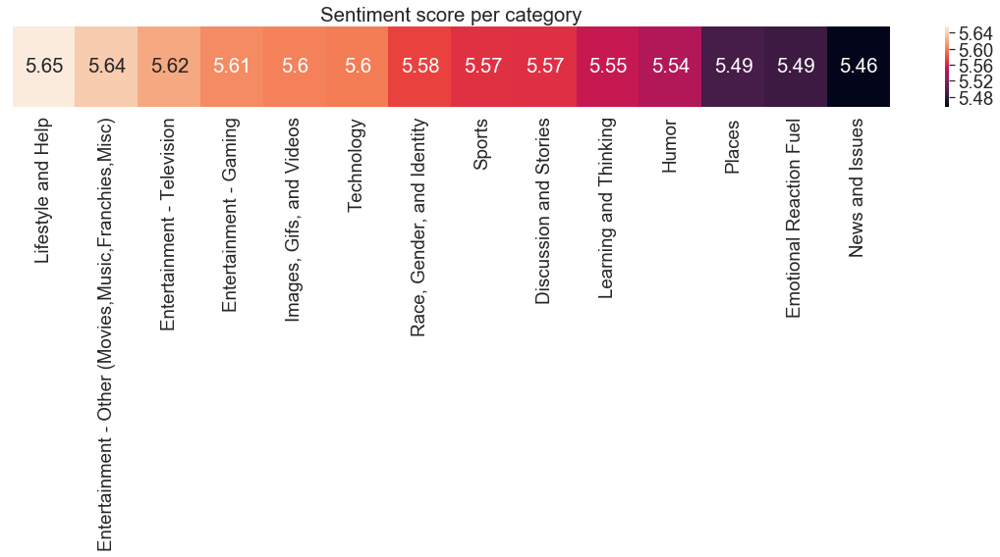

In [59]:
df_cm = pd.DataFrame(vals, index = labels, columns=['']).T
plt.figure(figsize = (20,1.5))

sn.set(font_scale=1.7)
sn.heatmap(df_cm, annot=True, fmt='.3g')

plt.title("Sentiment score per category")
plt.show()

A bit suprisingly the average sentiment of the different categories are quite close to each other. The difference from highest to lowest scoring is only ~0.20 in score.

However if we inspect the result and the word clouds above, it does seem to make sense albeit the low difference in scores. In the cloud for 'News and Issues' we find words like 'fuck', 'crime' and 'shit', whereas in the cloud for 'Lifestyle and Help' we find words 'nice' and 'love', where the latter is quite big.
This also complies with the intuitive notion that people on social media are likely to be offensive in forums/articles related to politics, news, etc.

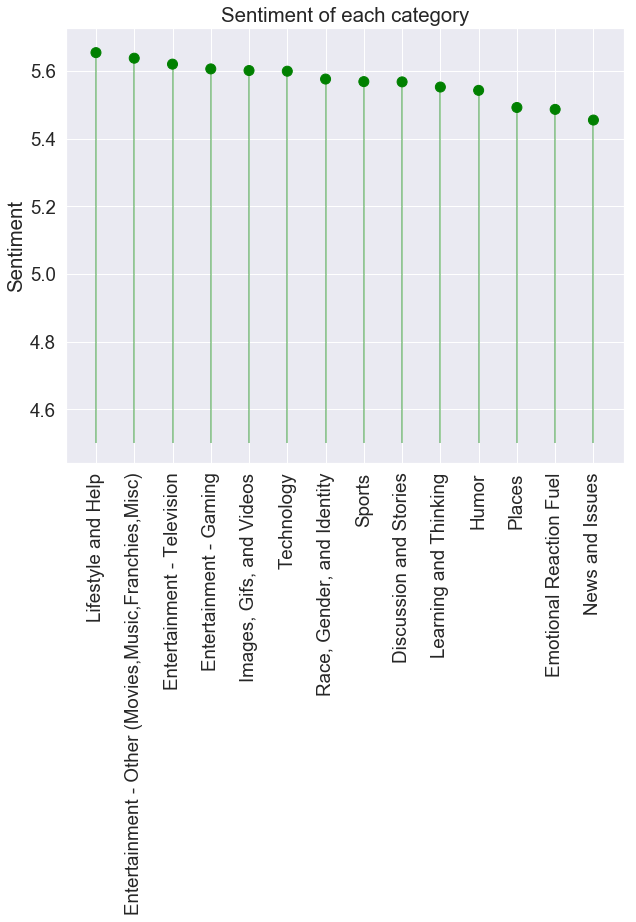

In [30]:
plt.figure(figsize=(10,8))
# Data
x = np.array(list(range(len(vals))))
y = np.array(vals)

limit = 4.5
 
# Create a color if the group is "B"
my_color=np.where(y>=limit, 'green', 'orange')
 
# The vertival plot is made using the hline function
# I load the seaborn library only to benefit the nice looking feature
import seaborn as sns
plt.vlines(x=x, ymin=limit, ymax=y, color=my_color, alpha=0.5)
plt.scatter(x, y, color=my_color, s=100, alpha=1)
 
# Add title and axis names
plt.title('Sentiment of each category')
plt.ylabel('Sentiment')
plt.xticks(range(len(vals)), labels, rotation=90)
plt.show()

### Lexical dispersion
Let's now look at lexical dispersion for sub of the categories

News and Issues


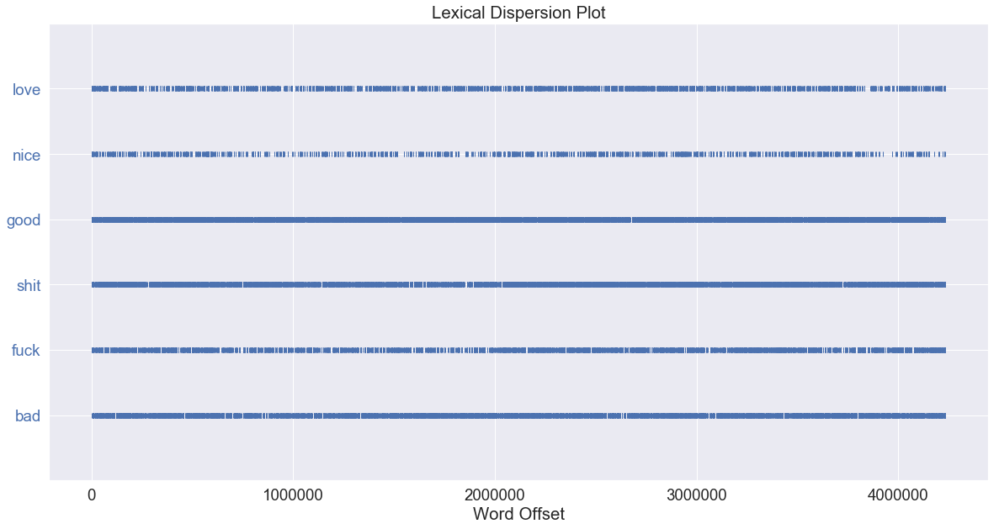

Lifestyle and Help


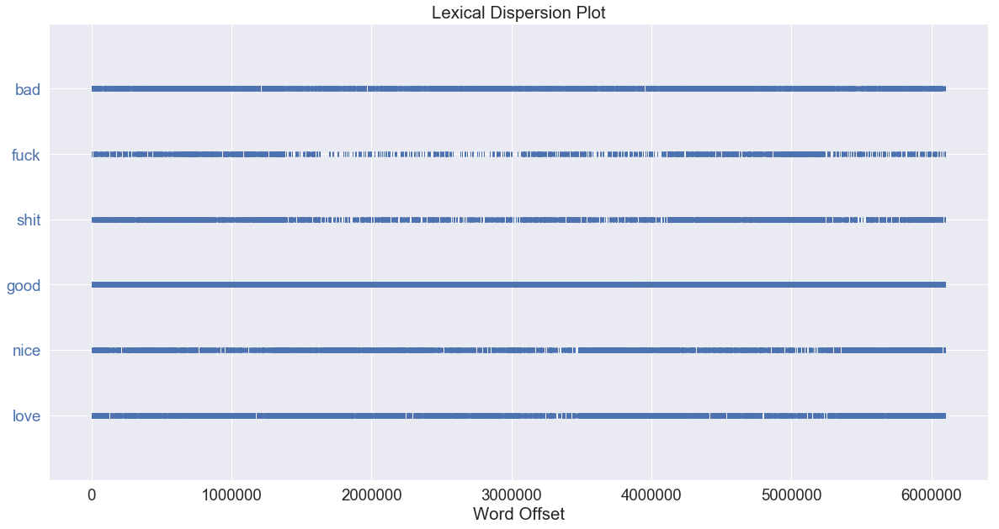

In [58]:
news_txt = category_texts['News and Issues']
life_txt = category_texts['Lifestyle and Help']

keywords = ['love', 'nice', 'good', 'shit', 'fuck', 'bad']

for txt, title in [(news_txt, 'News and Issues'), (life_txt, 'Lifestyle and Help')]:
    plt.figure(figsize=(20,10))
    print(title)
    nltk.Text(txt).dispersion_plot(keywords)
    plt.show()

Looking at the two plots we can see some clear differences. The frequency the positive words 'nice' and 'love' are quite a bit lower in 'News and Issues' than in 'Lifestyle and Help'. The same goes for the word 'fuck' in 'Lifestyle and Help' contrary to 'News and Issues'.

# Subreddit Networks
In this section we will explore the networks created from subreddits and the users in them.
I will be using the ForceAtlas algorithm and the Louvain algorithm to detect clusters.

In [301]:
G = nx.Graph()

for subreddit, users in all_users.items():
    for subreddit1, users1 in all_users.items():
        if subreddit != subreddit1:
            w = len(set(users).intersection(users1))
            if w > 0:
                if not G.has_edge(subreddit, subreddit1) or not G.has_edge(subreddit1, subreddit):
                    G.add_edge(subreddit, subreddit1, weight = w)

In [302]:
random_state = 5
pos = nx.spring_layout(G, k=0.75, iterations=30, seed=random_state)

positions = ForceAtlas2().forceatlas2_networkx_layout(G, pos, 2000)

100%|██████████| 2000/2000 [00:04<00:00, 451.97it/s]

('BarnesHut Approximation', ' took ', '1.65', ' seconds')
('Repulsion forces', ' took ', '1.57', ' seconds')
('Gravitational forces', ' took ', '0.03', ' seconds')
('Attraction forces', ' took ', '0.49', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.15', ' seconds')


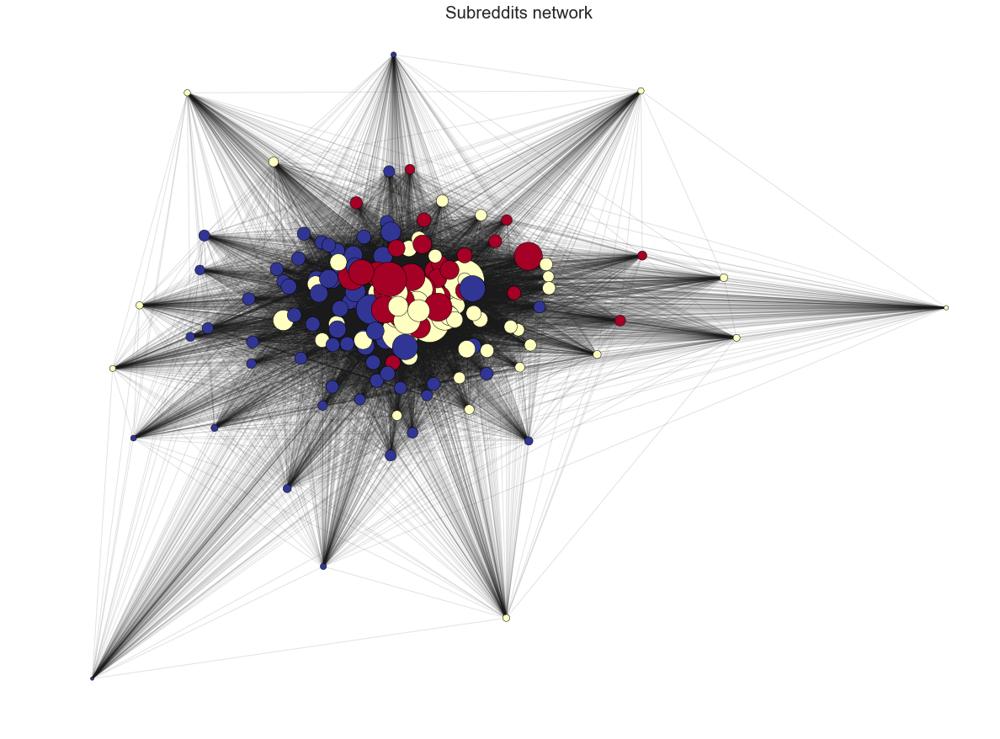

In [303]:
plt.figure(figsize=(20,15))

#first compute the best partition
partition = community_louvain.best_partition(G)

#drawing
weights = []
for node in G.nodes():
    if node in partition:
        w = sum([z['weight'] for (x,y),z in G.edges.items() if x == node or y == node])*0.03
        weights.append(w)

nx.draw_networkx_nodes(G, positions, node_size = weights,
                      edgecolors='#000000', linewidths=.5, width=0.4,
                       cmap=plt.cm.RdYlBu, node_color=list(partition.values()))


nx.draw_networkx_edges(G, positions, alpha=0.125)
plt.axis('off')
plt.title('Subreddits network')
plt.show()

### Categories
A graph showing the connections between the overall categories will be constructed.
Each category is a node and if two categories has common users the two nodes are connected. The weight of the edges is the number of common users in the categories.
Again, the Louvain algorithm will be applied to see if any clusters appear.

In [263]:
category_users = {}

for subreddit, users in all_users.items():
    category = subreddits_category[subreddit]
    try:
        category_users[category] = list(set(category_users[category] + users))
    except:
        category_users[category] = users

100%|██████████| 2000/2000 [00:00<00:00, 9248.94it/s] 


('BarnesHut Approximation', ' took ', '0.05', ' seconds')
('Repulsion forces', ' took ', '0.03', ' seconds')
('Gravitational forces', ' took ', '0.01', ' seconds')
('Attraction forces', ' took ', '0.01', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.02', ' seconds')


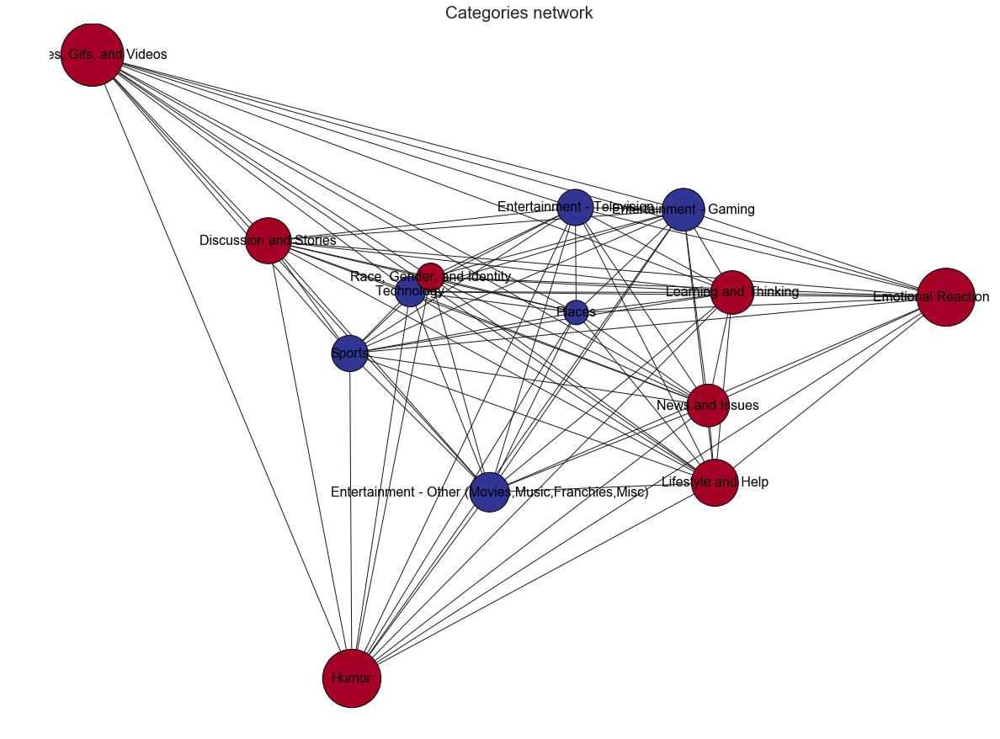

In [305]:
#construct graph
G = nx.Graph()

for category, users in category_users.items():
    for category1, users1 in category_users.items():
        if category != category1:
            w = len(set(users).intersection(users1))
            if w > 0:
                if not G.has_edge(category, category1) or not G.has_edge(category1, category):
                    G.add_edge(category, category1, weight = w)

#apply a force directed layout
random_state = 5
pos = nx.spring_layout(G, k=0.05, iterations=30, seed=random_state)

positions = ForceAtlas2().forceatlas2_networkx_layout(G, pos, 2000)                

plt.figure(figsize=(20,15))

#first compute the best partition
partition = community_louvain.best_partition(G)

#drawing
weights = []
for node in G.nodes():
    if node in partition:
        #set the node name as the key and the label as its value 
        labels[node] = node

        w = sum([z['weight'] for (x,y),z in G.edges.items() if x == node or y == node])*0.025
        weights.append(w)

nx.draw_networkx_nodes(G, positions, node_size = weights,
                      edgecolors='#000000', linewidths=1.0, width=0.4, 
                       cmap=plt.cm.RdYlBu, node_color=list(partition.values()))
nx.draw_networkx_labels(G, positions, labels, font_size=16, font_color='black')


nx.draw_networkx_edges(G, positions, alpha=1)
plt.axis('off')
plt.title('Categories network')
plt.show()

It seems that the nodes are clustered by the sizes of the categories. Every node in the red cluster is bigger than the blue nodes, except for the category 'Race, Gender and Identity'.

In [307]:
weights = {}

for category in all_categories:
    for x,y,z in G.edges.data():
        if x == category or y == category:
            w = z['weight']
            receiver = y if x == category else x
            try:
                prev_w = weights[category]
                if w > prev_w:
                    weights[category] = (receiver, w)
            except:
                weights[category] = (receiver, w)

# User overlapping
We will now look at what category the different categories share the most users with. For this I will use the graph above and remove all edges other than the heaviest.

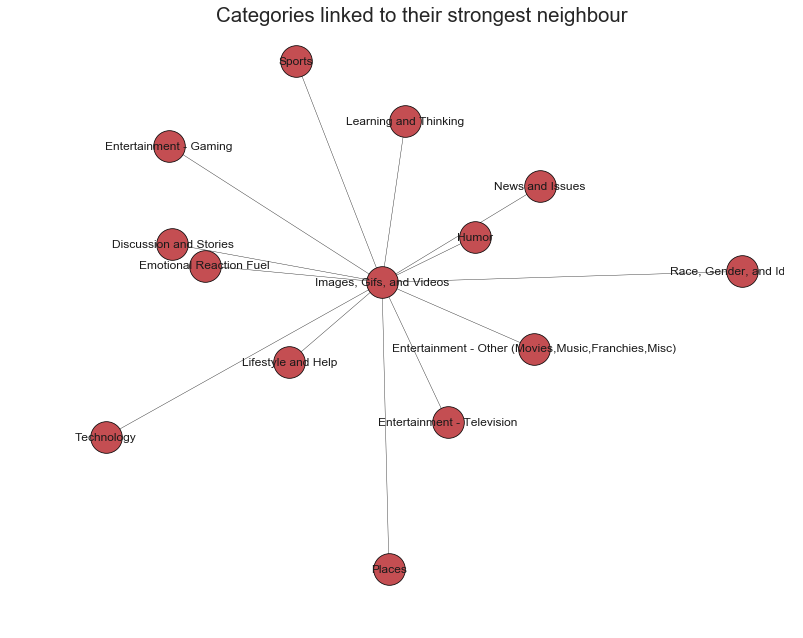

In [313]:
G1 = nx.Graph()

for cat1, (cat2, w) in weights.items():
    G1.add_edge(cat1,cat2, weight = w)

plt.figure(figsize=(10,8))
nx.draw(G1, with_labels=True, edgecolors='#000000', linewidths=0.75, width=0.4, node_size=1000)
plt.title('Categories linked to their strongest neighbour ')
plt.show()

It seems that every category shares the most users with the category 'Images, Gifs and Videos'. 
If we inspect the bar graph below, we find the answer as to why. The category 'Images, Gifs and Videos' is the category with the most subreddits in. It is not much bigger than 'Lifestyle and Help', so we must also credit its centrality to the content.

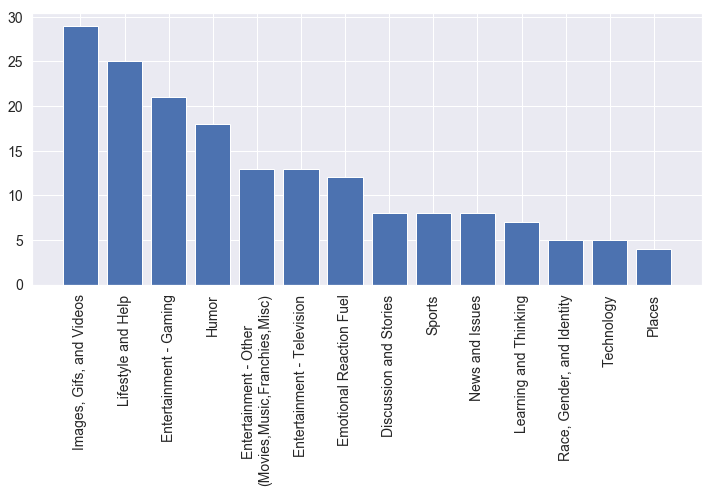

In [387]:
sorted_x = reversed(sorted([(x,len(y)) for (x,y) in categories_subreddits.items()], key=operator.itemgetter(1)))
xs, ys = zip(*sorted_x)

plt.figure(figsize=(12,5))
plt.xticks(fontsize=14,rotation=90)
plt.yticks(fontsize=14)
plt.bar(x=range(len(xs)), 
        height=ys, 
        tick_label=list(xs))
plt.show()

Let's now look at it a bit differently.

I will now construct a confusion matrix of all the categories showing what percentage of users each category share with each other.

In [63]:
labels = []
vals = []

for category in all_categories:
    val = []
    for category1 in all_categories:
        users = category_users[category]
        users1 = category_users[category1]
        w = len(set(users).intersection(users1))/len(set(users+users1))*100
        if w == 100:
            w = 0
        
        val.append(w)
    vals.append(val)
    labels.append(category)

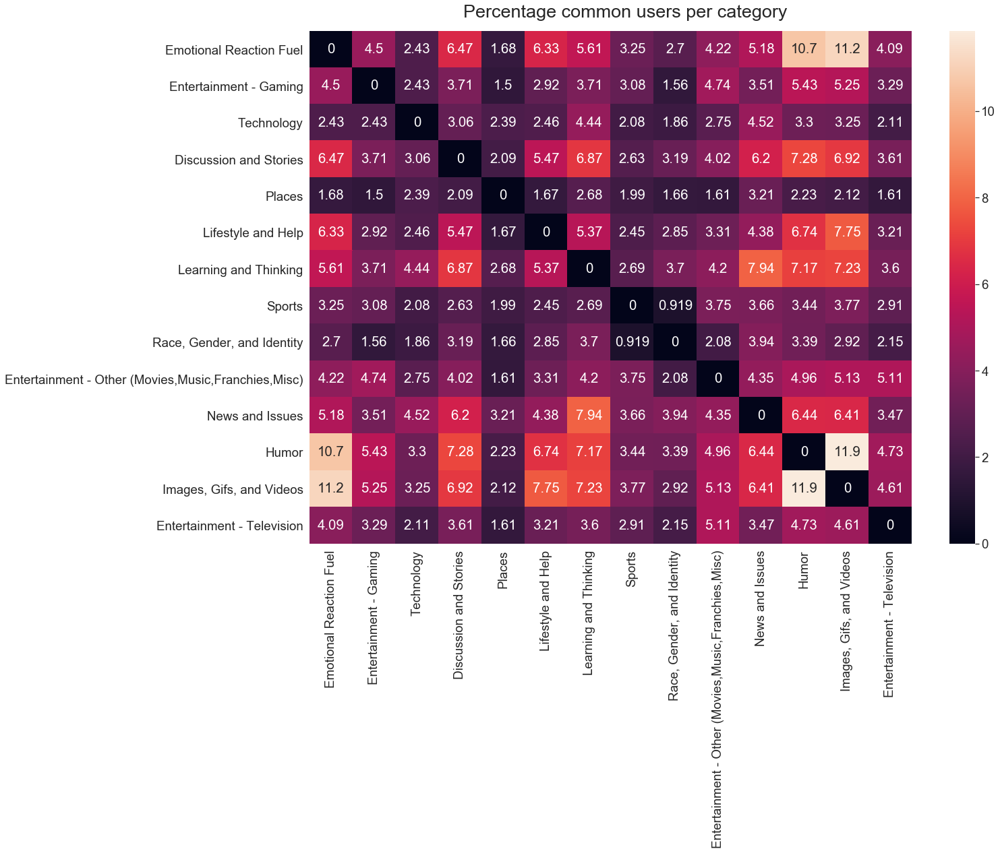

In [64]:
df_cm = pd.DataFrame(vals, index = labels,
                  columns = labels)
plt.figure(figsize = (20,14))

sn.set(font_scale=1.7)
sn.heatmap(df_cm, annot=True, fmt='.2g')
plt.figtext(.45,0.9,'Percentage common users per category',fontsize=27,ha='center')
plt.show()

From the confusion matrix we get some interesting information.
The highest scorer is the 'Humor'/'Images, Gifs and Videos' combination, which scores ~12 % shared users. This makes a lot of sense since images, gifs and videos shared on the internet are often memes and humorous clips.
The lowest scorer is 'Sports'/'Race, gender and Identity' with only ~0.9% shared users. This also makes some sense as 'Sports' mainly covers news in the sports world and discussion about matches, whereas 'Race, gender and Identity' are more self-reflecting subreddits about sexuality and such. 

# 4. Discussion. Think critically about your creation
* What went well?
    * I think I managed to showcase the overlapping of users between categories pretty well. 
    * The sentiment also worked okay, as the scores pretty much aligned with what is intuitive when considering people's online language.
* What is still missing? What could be improved?, Why?
    * For the network of subreddits, it would be interesting to reduce the number of links to only the strongest, to see what subreddits are central to others. Same goes for sentiment scores, where I would assume that subreddits like 'r/politics' would be a low scorer.
    * It could also be interesting to actually increase the information from each comment and add for example upvotes and downvotes. This can be used to atually see the popularity of each comment and maybe use this in a combination with maybe the network, to see the popular commenters in each category or subreddit. 